## ABSTRACT:

With an estimated 17.9 million deaths annually, or 31% of all deaths worldwide, cardiovascular diseases (CVDs) are the leading cause of mortality worldwide. Of those deaths, heart attacks and strokes account for four out of every five CVD fatalities, with one-third of these deaths occurring prematurely in those under the age of 70. Eleven characteristics in this dataset may be used to predict the risk of getting a cardiac condition. Heart failure is a frequent condition brought on by cardiovascular conditions.For people who have already been diagnosed with a disease or who have risk factors which includes diabetes, hypertension, or hyperlipidemia, early detection and treatment are essential

## Description of the problem:
  In this assignment we will create a complete Machine learning project with the following functions:
          1. Data Cleaning
          2.Feature selection
          3.Modeling
          4.Interpretability
   And then combine everything to make it a cohesive readable report.       
          

## Description of Variables in Dataset:

1.AGE: Age of the person in the dataset varies from 40-95

2.ANAEMIA: Anemia is a disorder in which the body does not produce enough healthy red blood cells to provide the tissues in your body with enough oxygen. Feeling weak and exhausted is a common symptom of anemia, also known as low hemoglobin. Anemia (1) if exsits. ; anemia (0) does not exsits.

3.CREATINE_PHOSHOKINASE: The enzyme known as creatine phosphokinase (CPK) is found throughout the body. It is mostly present in the skeletal muscle, brain, and heart. The typical values for total CPK are 10 to 120 micrograms per liter, or mcg/L.

4.DIABETES: Diabetes is a chronic disease that occurs either when the pancreas does not produce enough insulin or when the body cannot effectively use the insulin it produces. Diabetes(1) if exsits. ; diabetes (0) does not exsits.

5.EJECTION_FRACTION: EF is a measurement of the volume of blood the left ventricle expels with each contraction. It is given as a percentage. A 60 percent ejection fraction indicates that with every pulse, 60 percent of the blood in the left ventricle is forced out. This measure of cardiac pumping efficiency may be used to diagnose and monitor heart failure. The ejection fraction of a normal heart may range from 50 to 70 percent.

6.HIGH_BLOOD_PRESSURE: Your blood pressure is considered high when you have consistent systolic readings of 130 mm Hg or higher or diastolic readings of 80 mm Hg or higher. Higher blood pressure means (1), if the blood pressure is normal then (0).

7.PLATELETS: Colourless blood cells called platelets aid in blood clotting. When blood vessels are injured, platelets cluster together to create plugs that halt the bleeding. Thrombocytopenia may be caused by an immune system issue or a bone marrow disease like leukemia. A normal blood platelet count ranges from 150 to 400 × 109/L, or 150,000 to 400,000 platelets per microliter (mcL).

8.SERUM_CREATININE: Your blood's creatinine levels ought to be comparatively constant. A higher creatinine level might indicate impaired renal function. The measurement of serum creatinine is expressed in either milligrams per deciliter of blood (mg/dL) or micromoles per liter of blood (micromoles/L). The typical values by age are as follows: 0.9–1.3 mg/dL in male adults. 0.6–1.1 mg/dL in female adults. 0.5 to 1.0 mg/dL in kids between the ages of 3 and 18.

9.SERUM_SODIUM: Serum sodium levels are routinely measured to evaluate renal function, electrolyte, and acid-base balance. About 95% of the osmotically active chemicals in the extracellular compartment are sodium-based, assuming the patient is not suffering from acute hyperglycemia or renal failure. Blood sodium levels should be between 135 and 145 milliequivalents per liter (mEq/L).

10.SEX: The dataset has two sex male and female. Male represents (1) and the female represents (0).

11.SMOKING: The person who smokes is considered as true(1) and the person who doesn't smoke is considered as false(0).

12.TIME: In this dataset, Time is the follow up period represented in days.

13.DEATH_EVENT: In this data (1) is considered dead and (0) is considered alive.

## Data Exploration
    "Data Exploration" refers to the initial step in data analysis, where users visually and quantitatively examine the data to understand patterns, spot anomalies, test hypotheses, or check assumptions. It involves using statistical summaries and graphical representations to understand the structure, attributes, and relationships within the dataset. This process is crucial for familiarizing oneself with the data, identifying trends and patterns, and formulating insights for more complex analyses.

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
!pip install plotly
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score,confusion_matrix
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve


[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [28]:
## Getting my dataset my data_science github repository
data_set = pd.read_csv('https://raw.githubusercontent.com/Manish-dkv/Data_science_manish/main/Heart_failure_clinical_records_dataset%202.csv')
data_set.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [29]:
## To get the dimentions of the datset
data_set.shape

(299, 13)

In [30]:
## Summary of the dataset
data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [31]:
## Separate the dataset into numerical value and categorical value.
numeric = ['age', 'creatinine_phosphokinase', 
           'ejection_fraction', 'platelets', 
           'serum_creatinine', 'time']
categorical = ['anaemia', 'diabetes', 'high_blood_pressure', 
               'sex', 'smoking']

Convert age column from float to integer on the data set

In [32]:
data_set.age = data_set.age.astype('int64')

In [33]:
data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    int64  
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(2), int64(11)
memory usage: 30.5 KB


In [34]:
## Check is there any null values
data_set.isnull().sum()

age                         0
anaemia                     0
creatinine_phosphokinase    0
diabetes                    0
ejection_fraction           0
high_blood_pressure         0
platelets                   0
serum_creatinine            0
serum_sodium                0
sex                         0
smoking                     0
time                        0
DEATH_EVENT                 0
dtype: int64

There are no null values

## Exploratory Data Analysis-EDA:
   Exploratory Data Analysis is a critical initial step in the data analysis process, involving the examination,
   summarization, and visualization of data to uncover patterns, spot anomalies, test hypotheses, and check
   assumptions. It helps in gaining insights and understanding of the data's underlying structure and
   characteristics before applying more formal statistical or machine learning models.

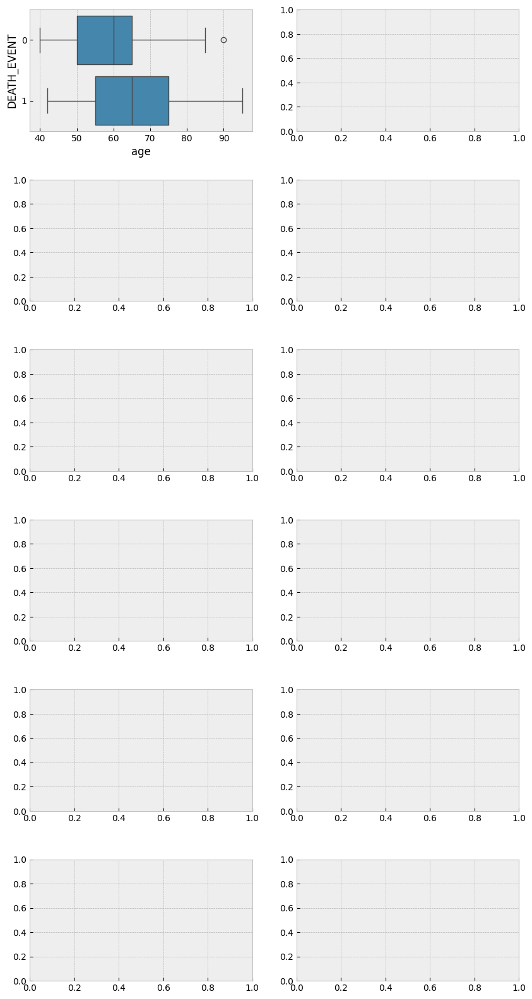

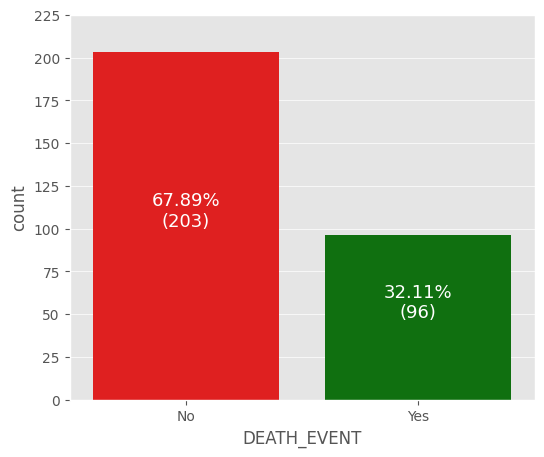

In [35]:
target_count = data_set.DEATH_EVENT.value_counts()
with plt.style.context('ggplot'):
    plt.figure(figsize=(6, 5))
    # Assign the 'DEATH_EVENT' column to both 'x' and 'hue' parameters
    sns.countplot(data=data_set, x='DEATH_EVENT', hue='DEATH_EVENT', palette=['red', 'green'], legend=False)
    for name, val in zip(target_count.index, target_count.values):
        plt.text(name, val/2, f'{round(val/sum(target_count)*100, 2)}%\n({val})', ha='center',
                 color='white', fontdict={'fontsize':13})
    plt.xticks(ticks=target_count.index, labels=['No', 'Yes'])
    plt.yticks(np.arange(0, 230, 25))
    plt.show()


"67.89%" No event and "32.11%" Yes event
The code generates a count plot using Seaborn, displaying the frequency distribution of the 'DEATH_EVENT' column from the `data_set` DataFrame. The bars in the plot are color-coded in red and green. Each bar is annotated with the percentage and count of each category in the 'DEATH_EVENT' column. The x-axis is labeled with custom labels ('No' and 'Yes'), and the y-axis has specified tick intervals. The plot style is set to 'ggplot'. Additionally, a FutureWarning indicates a need to adjust the code for compatibility with future Seaborn versions.

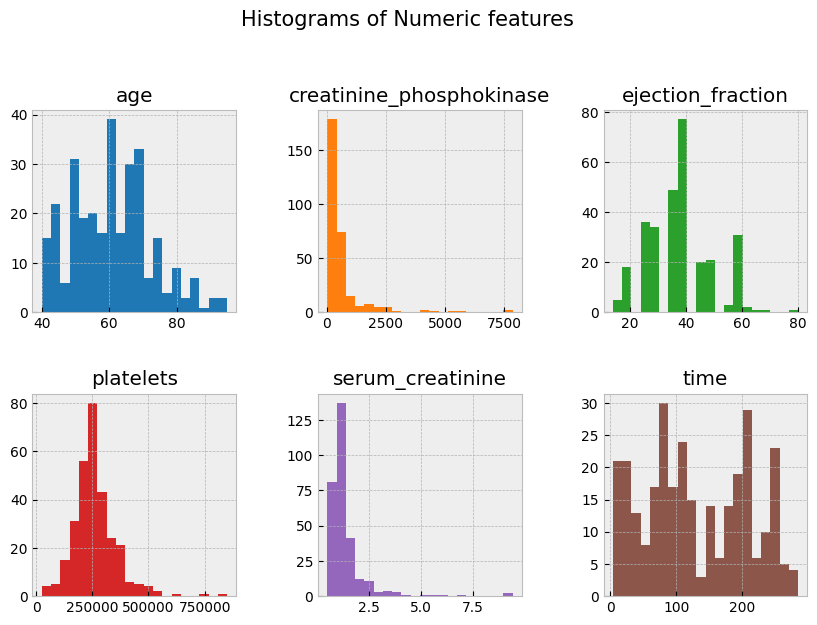

In [36]:
import matplotlib.pyplot as plt
import pandas as pd

numeric = ['age', 'creatinine_phosphokinase', 'ejection_fraction', 'platelets', 'serum_creatinine', 'time']

# Set the style to 'bmh'
plt.style.use('bmh')

# Create a figure with specified size
plt.figure(figsize=(10, 10))

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.4)

# Iterate over the numeric columns to create individual histograms
for i, name in enumerate(numeric):
    plt.subplot(3, 3, i + 1)
    plt.hist(data_set[name], bins=20, color=colors[i])  # Using matplotlib's hist function
    plt.title(name)

# Set the overall title for all subplots
plt.suptitle('Histograms of Numeric features', fontsize=15)

# Show the plot
plt.show()


These histograms are:

Age: Showcases a distribution that appears to be slightly right-skewed, suggesting a larger number of younger individuals than older ones within the dataset.

Creatinine Phosphokinase: Reveals a highly right-skewed distribution with most values clustered near the lower end, indicating that high levels of this enzyme are less common.

Ejection Fraction: Presents a distribution that appears to be somewhat normally distributed but with potential outliers on the higher end.

Platelets: Displays a nearly normal distribution with a slight right skew, centered around the median value of the platelet count.

Serum Creatinine: Illustrates a right-skewed distribution, similar to creatinine phosphokinase, where most individuals have lower serum creatinine levels.

Time: Shows a multi-modal distribution, indicating that certain time periods are more commonly represented in the dataset than others.

The histograms are color-coded, and each is labeled with the name of the corresponding feature. The overall title "Histograms of Numeric Features" suggests that the purpose of this visualization is to explore the distributions of numerical data within the dataset.

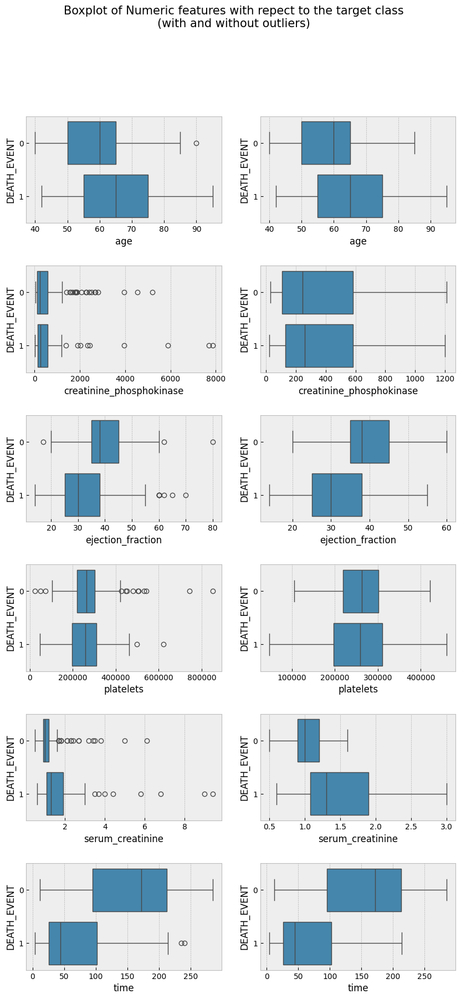

In [41]:
fig, axes = plt.subplots(6, 2, figsize=(10, 20))
plt.subplots_adjust(hspace=0.4)
axes = axes.ravel()
for i, name, col in zip(np.arange(0, 14, 2), numeric, colors):
    sns.boxplot(data=data_set, x=name, ax=axes[i], y='DEATH_EVENT', 
                orient='h',showfliers=True)
    sns.boxplot(data=data_set, x=name, ax=axes[i+1], y='DEATH_EVENT', 
                orient='h', showfliers=False)
plt.suptitle('Boxplot of Numeric features with repect to the target class\n(with and without outliers)', 
             fontsize=15)
plt.show()

The figure displays a series of boxplots for six numeric features from the data_set DataFrame, with respect to the target class 'DEATH_EVENT'. Each numeric feature has two boxplots: one including outliers and one excluding them.

Age: The boxplots for age show a range of values with some outliers. The distribution is similar for both DEATH_EVENT categories, with or without outliers.

Creatinine Phosphokinase: These boxplots indicate a wide range of values with several outliers present. When outliers are excluded, the distributions tighten, particularly for non-events.

Ejection Fraction: There's a notable difference in the spread of ejection fraction values between events and non-events. Outliers appear to be more prevalent in non-events.

Platelets: The boxplots for platelets show a fairly symmetric distribution with a few outliers. The non-event category appears to have a slightly higher median.

Serum Creatinine: Serum creatinine levels exhibit several outliers, especially in the event category. The medians differ noticeably between events and non-events.

Time: Time-related boxplots show a significant number of outliers in both categories. The non-event category has a broader range, suggesting a longer duration before the event occurs.

The left column of boxplots includes outliers, which show the full range of data including extreme values. The right column excludes outliers, providing a view of the data's central distribution. This dual representation helps in understanding the underlying data structure and the impact of outliers on the feature distributions. The title suggests the plots are intended to compare the numeric features with the outcome of the DEATH_EVENT, considering the presence and absence of outliers.

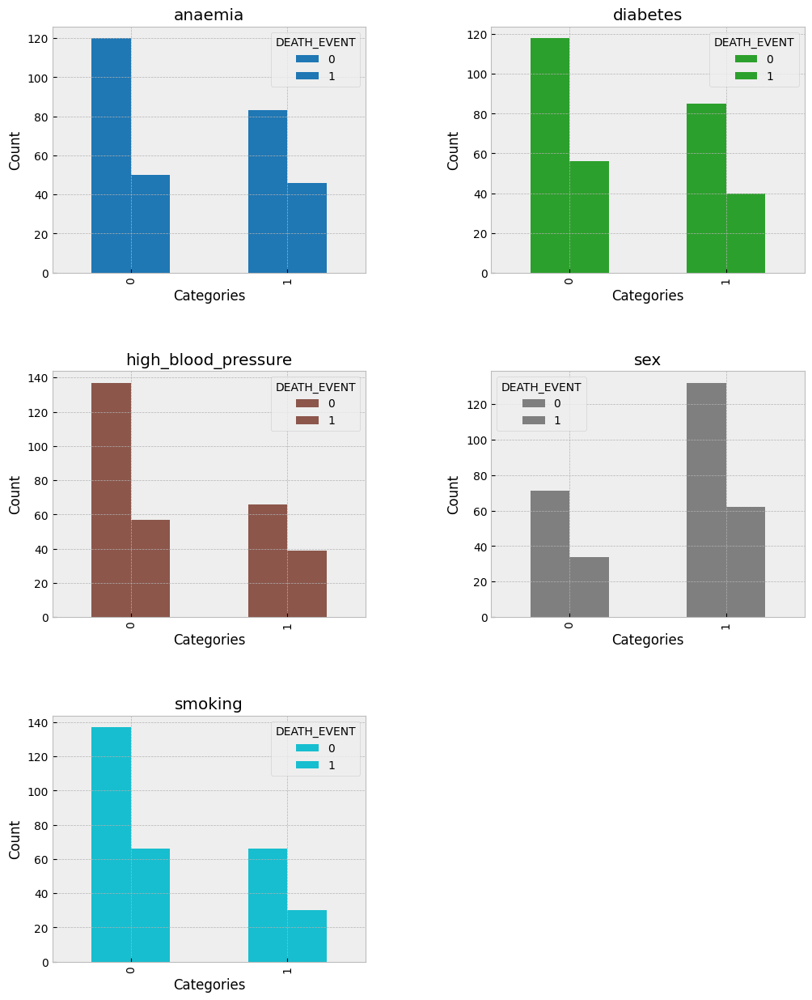

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

categorical = ['anaemia', 'diabetes', 'high_blood_pressure', 'sex', 'smoking']

# Define a color palette
colors = plt.cm.tab10(np.linspace(0, 1, len(categorical)))

# Set the style to 'bmh'
plt.style.use('bmh')

# Create a figure with specified size
plt.figure(figsize=(12, 15))

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.4)

# Iterate over the categorical columns to create individual count plots
for i, (col, name) in enumerate(zip(colors, categorical)):
    ax = plt.subplot(3, 2, i + 1)
    # Get the counts for each category
    category_counts = data_set.groupby(name)['DEATH_EVENT'].value_counts().unstack(fill_value=0)
    # Create a bar plot for each category
    category_counts.plot(kind='bar', ax=ax, color=col)
    ax.set_title(name)
    ax.set_xlabel('Categories')
    ax.set_ylabel('Count')
    ax.legend(title='DEATH_EVENT')

# Show the plot
plt.show()


The output would consist of a series of count plots, one for each categorical variable, showing how many instances of each category have a 'DEATH_EVENT' value of 0 or 1. This visualization is useful for understanding the relationship between the categorical features and the likelihood of a death event occurring.

## Data Preparation

In [51]:
X = data_set.iloc[:, :-1]
y = data_set['DEATH_EVENT']

X is the predictor variable except death_event 

Y is the target variable(death_event)

In [52]:
print(X.shape)
print(y.shape)

(299, 12)
(299,)


In [55]:
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier

# Initialize SMOTE with a KNeighborsClassifier estimator
knn = KNeighborsClassifier(n_neighbors=5, n_jobs=-1)
smote = SMOTE(random_state=2021, k_neighbors=5)
X_smote, y_smote = smote.fit_resample(X, y)


Here's what it does:

Imports the SMOTE class from the imblearn.over_sampling module, which is designed for oversampling the minority class in a dataset.

Imports the KNeighborsClassifier from sklearn.neighbors. However, it's important to note that in this snippet, KNeighborsClassifier is not directly used with SMOTE, but it is generally used for providing a nearest neighbors estimator.

knn is an instance of KNeighborsClassifier with n_neighbors set to 5, indicating that the nearest 5 neighbors will be considered in the algorithm, and n_jobs set to -1, which allows the classifier to use all available CPU cores for parallel processing. However, this instance (knn) is not used in the provided code snippet.

smote is an instance of SMOTE with a random_state set for reproducibility of results and k_neighbors set to 5, which is used internally by SMOTE when creating synthetic samples.

smote.fit_resample(X, y) is called to perform the oversampling on the feature set X and the target y. The method returns a resampled feature set X_smote and target y_smote where the class distribution is more balanced.

The final result is a balanced dataset where the minority class has been oversampled to match the number of instances of the majority class, thus potentially improving the performance of classifiers trained on this data.

In [56]:
print(X_smote.shape)
print(y_smote.shape)

(406, 12)
(406,)


## SMOTE
The target variable in the dataset displays an imbalance, which can be addressed by using SMOTE (Synthetic Minority Over-sampling Technique). SMOTE is a technique that creates synthetic data for the minority class to balance the dataset. Unlike random oversampling, which can cause overfitting by replicating minority class instances, SMOTE generates new instances by interpolating between existing ones in the feature space. This method aids in creating a more general model by providing a richer and more nuanced representation of the minority class.

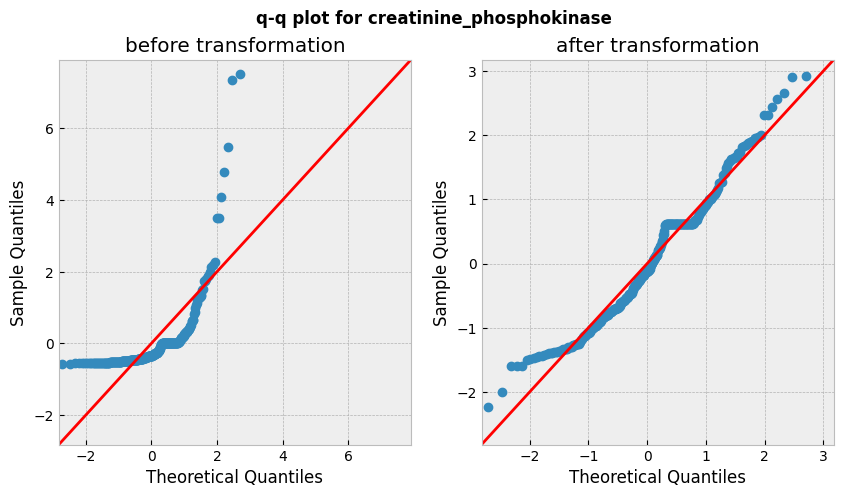

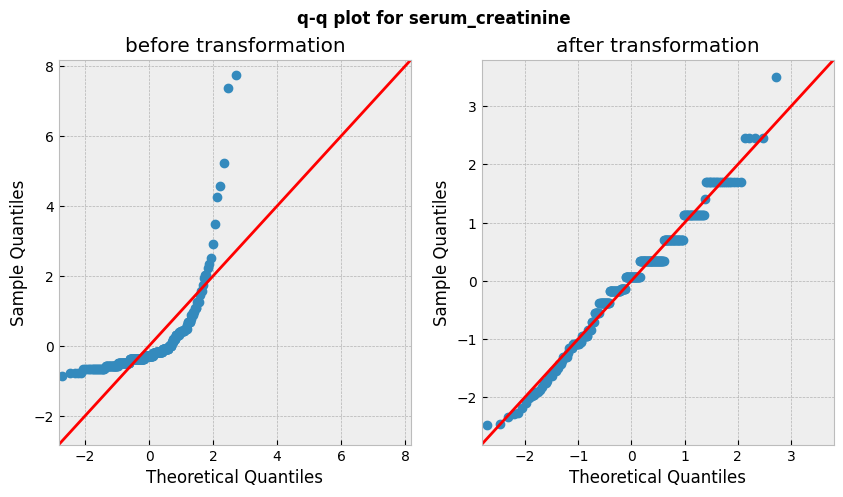

In [57]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sm.qqplot(np.log10(data_set.creatinine_phosphokinase), fit=True, line='45', ax=ax[1])
sm.qqplot(data_set.creatinine_phosphokinase, fit=True, line='45', ax=ax[0])
ax[0].set_title('before transformation')
ax[1].set_title('after transformation')
plt.suptitle('q-q plot for creatinine_phosphokinase', fontweight='bold')
plt.show()
p=-1
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sm.qqplot(data_set.serum_creatinine, fit=True, line='45', ax=ax[0])
ax[0].set_title('before transformation')
sm.qqplot(data_set.serum_creatinine**p, fit=True, line='45', ax=ax[1])
ax[1].set_title('after transformation')

plt.suptitle('q-q plot for serum_creatinine', fontweight='bold')
plt.show()

These Q-Q plots help visualize whether the data follows a normal distribution. If the points in the Q-Q plot closely follow the reference line (45-degree line), it suggests that the data is approximately normally distributed. Any deviations from the line indicate departures from normality. The log transformation (np.log10) and raising to the power of -1 are likely used to explore different data transformations and their impact on the distribution.

Applying a log transformation to the data can help bring it closer to a normal distribution. In this specific case, the log transformation is effective in reducing or eliminating skewness because the original data exhibits characteristics of a log-normal distribution or something very similar.

The Q-Q plot displayed below illustrates the impact of the log transformation on the 'creatinine_phosphokinase' variable. A Q-Q plot, short for quantile-quantile plot, is a visualization tool designed to make a normal (Gaussian) distribution appear as a straight line. Essentially, a perfectly normal distribution would precisely align with a line that has a slope of 1 and an intercept of 0.

So, in simpler terms, the log transformation helps make the data more normally distributed, and the Q-Q plot demonstrates how well the transformed data aligns with the expectations of a normal distribution.

In [59]:
from sklearn.preprocessing import PowerTransformer

# Initialize the PowerTransformer with the Yeo-Johnson method
pt = PowerTransformer(method='yeo-johnson')

# Fit and transform the feature set X_smote
X_pt = pt.fit_transform(X_smote)


The `PowerTransformer` in scikit-learn offers two methods, namely Box-Cox and Yeo-Johnson, to make data distributions more Gaussian-like:

1. **Box-Cox Transformation**: The Box-Cox transformation is a technique commonly used to improve the accuracy of linear regression predictions. It serves three primary purposes:
   - **Variance Stabilization**: It helps stabilize the variance of the data, making it less dependent on the mean.
   - **Normality Improvement**: It aims to make the data distribution more normal or Gaussian, which is often an assumption in statistical modeling.
   - **Enhanced Pattern Recognition**: By transforming the data, it can make underlying patterns in the data more apparent and easier to interpret.

2. **Yeo-Johnson Transformation**: The Yeo-Johnson Power Transformation operates in a similar way to Box-Cox but with a distinct advantage. While both methods work on positive data, the Yeo-Johnson method can also handle data with negative values. It achieves this by inflating low variance data points and deflating high variance ones, resulting in a dataset that is more uniform and can better fit a Gaussian distribution.

In summary, both Box-Cox and Yeo-Johnson transformations are techniques used to make data more Gaussian-like, but the Yeo-Johnson method has the added capability of handling data with negative values, making it a more versatile choice in some situations.

## Normalize Data
Normalize the data using the Min-Max Scaler, a method that rescales the data to a range between 0 and 1. This scaling process is essential for machine learning algorithms such as SVM, Logistic Regression, and K-Nearest Neighbors, which can be influenced by the scale of the data and the presence of outliers. This normalization is beneficial for both classification and regression tasks, ensuring that the algorithms perform effectively and consistently.

In [62]:
## Standardize or normalize the feature data in the variable X_pt using Min-Max scalin
mm = MinMaxScaler()
X_scaled = mm.fit_transform(X_pt)

Min-Max scaling is a data preprocessing technique that transforms the values of each feature to fall within the range of 0 to 1. 

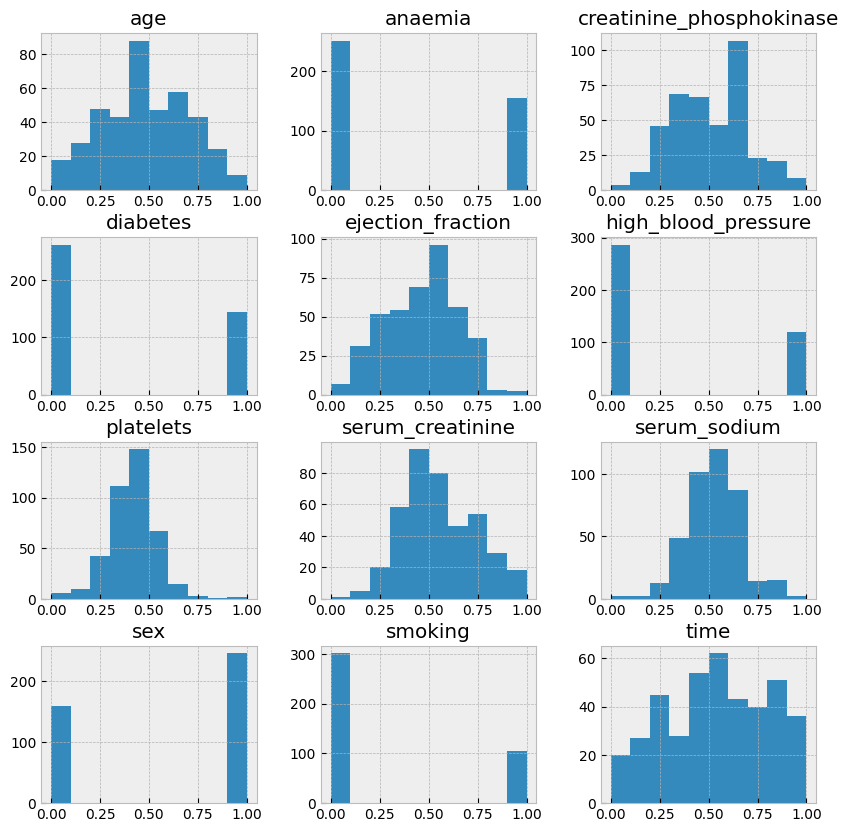

In [61]:
pd.DataFrame(X_scaled, columns=X.columns).hist(figsize=(10, 10))
plt.show()

The output of the code will be a grid of histograms, one for each feature in the dataset. Each histogram represents the distribution of values for a specific feature after Min-Max scaling. The x-axis of each histogram represents the range of scaled values (typically from 0 to 1), and the y-axis represents the frequency or count of values falling within each bin.

This visualization is useful for understanding how the scaling has affected the distribution of each feature. It allows you to observe whether the data has been effectively scaled to the 0-1 range and whether any features exhibit unusual or unexpected patterns in their distributions. Histograms provide insights into the data's spread, central tendency, and potential outliers.

## Feature Selection
  **Random Forest:**
   Random Forest is chosen as the method for determining important variables due to its inherent capabilities. In the context of Random Forest, each individual tree possesses the ability to assess the importance of a feature based on its capacity to enhance the purity of the leaf nodes in the tree. Essentially, the greater the improvement in the purity of the leaf nodes achieved by considering a particular feature, the higher its importance is rated. This evaluation is performed independently for each tree within the Random Forest ensemble. Subsequently, these importance scores are aggregated by taking the average across all the trees in the ensemble. To ensure comparability and meaningful interpretation, these scores are then normalized to a cumulative value of 1. Therefore, the cumulative importance scores calculated by a Random Forest sum up to 1, providing a clear and standardized measure of the significance of each feature in the dataset.

In [65]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
random_forest = RandomForestClassifier()

The primary aim of the above code is to set up the foundation for fine-tuning the Random Forest model's hyperparameters using GridSearchCV. Hyperparameter tuning is a crucial step in optimizing the model's performance for a specific classification task. After initializing the model, you would typically define the hyperparameter grid and use GridSearchCV to search for the best combination of hyperparameters that yields the highest model performance on a validation dataset

In [67]:
## Create a Random Forest Classifier
random_forest= RandomForestClassifier(n_estimators=100, max_depth=10, n_jobs=-1, 
                            class_weight='balanced', random_state=2021)
random_forest.fit(X_scaled, y_smote)

RandomForestClassifier(class_weight='balanced', max_depth=10, n_jobs=-1,
                       random_state=2021)

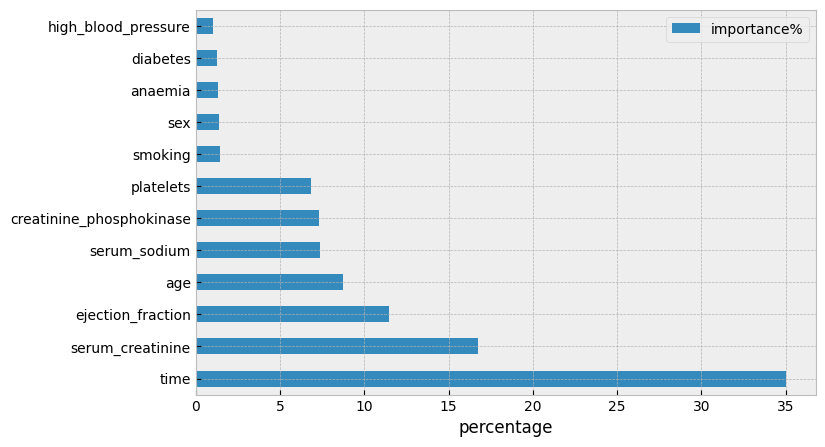

In [69]:
## Visual representation
feature_imp = pd.DataFrame(np.round(random_forest.feature_importances_*100, 2), index=X.columns, columns=['importance%'])
feature_imp = feature_imp.sort_values(by='importance%', ascending=False)
feature_imp.plot(kind='barh', figsize=(8, 5))
plt.xlabel('percentage')
plt.show()

The graph shows that time is the most important feature. 

In [71]:
imp_features = feature_imp.index[:3]
imp_features

Index(['time', 'serum_creatinine', 'ejection_fraction'], dtype='object')

In [72]:
X_selected = pd.DataFrame(X_scaled, columns=X.columns)[imp_features]

In [73]:
X_selected

,time,serum_creatinine,ejection_fraction
0,0.000000,0.737676,0.165986
1,0.029502,0.489581,0.512213
2,0.042589,0.575762,0.165986
3,0.042589,0.737676,0.165986
4,0.054846,0.845279,0.165986
...,...,...,...
401,0.142785,0.527085,0.542704
402,0.142785,0.856704,0.319941
403,0.222609,0.436728,0.557539
404,0.293088,0.492972,0.641457


In [74]:
model_data = X_selected
model_data['target'] = y_smote

In [75]:
model_data

,time,serum_creatinine,ejection_fraction,target
0,0.000000,0.737676,0.165986,1
1,0.029502,0.489581,0.512213,1
2,0.042589,0.575762,0.165986,1
3,0.042589,0.737676,0.165986,1
4,0.054846,0.845279,0.165986,1
...,...,...,...,...
401,0.142785,0.527085,0.542704,1
402,0.142785,0.856704,0.319941,1
403,0.222609,0.436728,0.557539,1
404,0.293088,0.492972,0.641457,1


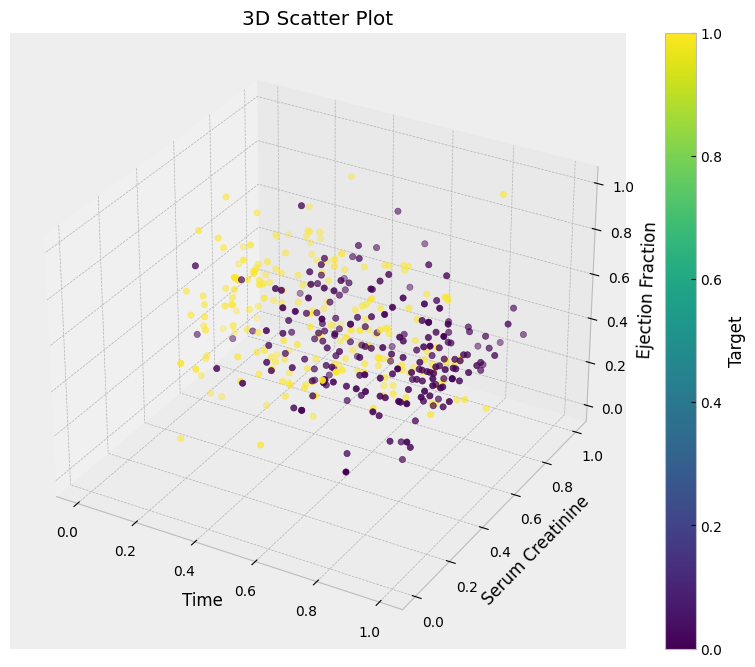

In [84]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Define the data for the three axes and color
x = model_data['time']
y = model_data['serum_creatinine']
z = model_data['ejection_fraction']
color = model_data['target']  # Use this variable for coloring data points

# Scatter plot
scatter = ax.scatter(x, y, z, c=color, cmap='viridis')

# Customize the plot (add labels, title, colorbar, etc.)
ax.set_xlabel('Time')
ax.set_ylabel('Serum Creatinine')
ax.set_zlabel('Ejection Fraction')
ax.set_title('3D Scatter Plot')
fig.colorbar(scatter, label='Target', orientation='vertical')

# Show the plot
plt.show()



This 3D scatter plot illustrates the distribution of target values based on the selected features. It provides a visual representation of how the different classes within the target variable are spread across the specified feature dimensions.

In the context of classifier tuning, a significant departure from traditional accuracy-based tuning is employed. Instead, the focus is on optimizing classifiers to maximize the F1 score, a metric that strikes a balance between precision and recall. The F1 score becomes particularly relevant in scenarios involving imbalanced datasets, where one class predominates over the others. In such cases, optimizing solely for accuracy can lead to misleading results, as a classifier may achieve high accuracy by simply favoring the majority class while neglecting the minority class.

The F1 score, on the other hand, offers a comprehensive assessment by considering both precision (the ratio of true positives to all predicted positives) and recall (the ratio of true positives to all actual positives). By maximizing the F1 score during classifier tuning, the objective is to ensure that the classifier excels in correctly identifying instances from both classes, rather than solely focusing on the majority class. This approach is particularly valuable in real-world applications where the minority class holds critical significance, such as in fields like medical diagnosis or fraud detection.


# DATA PREPARATION

In [87]:
## Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(model_data.drop(['target'], axis=1), 
                                                    model_data['target'], 
                                                    test_size = 0.20,
                                                    shuffle = True,
                                                    random_state=43, 
                                                    stratify=model_data['target'])
                                                   
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(324, 3)
(324,)
(82, 3)
(82,)


## KNN
The k-Nearest Neighbors (k-NN) algorithm is a supervised learning method used for classification and regression tasks.

In [88]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_predict
knn_clf = KNeighborsClassifier(n_jobs=-1)

In [89]:
knn_params = {
    'n_neighbors': np.arange(2, 12)
}
knn_cv = GridSearchCV(knn_clf, knn_params, scoring='f1', n_jobs=-1, cv=10)
knn_cv.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(n_jobs=-1), n_jobs=-1,
             param_grid={'n_neighbors': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11])},
             scoring='f1')

In [90]:
knn_cv.best_params_

{'n_neighbors': 9}

The optimal configuration to achieve the highest performance, specifically the highest F1 score, was found to be using the k-Nearest Neighbors (k-NN) algorithm with a choice of 9 neighbors.

In [91]:
knn_train_pred = cross_val_predict(knn_cv, X_train, y_train, cv=10, n_jobs=-1)

Cross-validation is a method employed in machine learning to assess how well a model performs when data is limited. It works by dividing the available data into multiple subsets or "folds" and training the model on various combinations of these folds. Meanwhile, one fold is held out for validation purposes to gauge the model's effectiveness.

In [92]:
print(classification_report(y_train, knn_train_pred, digits=4, target_names=['will not die', 'will die']))

              precision    recall  f1-score   support

will not die     0.8688    0.8580    0.8634       162
    will die     0.8598    0.8704    0.8650       162

    accuracy                         0.8642       324
   macro avg     0.8643    0.8642    0.8642       324
weighted avg     0.8643    0.8642    0.8642       324



Precision, recall, and F1-score are important metrics used to evaluate the performance of a model in binary classification:

Precision measures the proportion of correct positive predictions out of all positive predictions. For the "will not die" class, it's 0.8688, and for the "will die" class, it's 0.8598.

Recall calculates the fraction of true positive predictions out of all actual positive instances. It's 0.8580 for the "will not die" class and 0.8704 for the "will die" class.

F1-score is the harmonic mean of precision and recall, offering a balanced assessment. The F1-score for the "will not die" class is 0.8634, and for the "will die" class, it's 0.8650.

The overall accuracy of the model on the dataset is 0.8642, indicating that it correctly predicted the class for 86.42% of the samples. Both the macro and weighted average F1-scores are also 0.8642

## LOGISTIC REGRESSION
Logistic regression uses logit function to compute the probability of the outcomes, in our case, the target class Death Event

In [93]:
from sklearn.linear_model import LogisticRegression
lr_clf = LogisticRegression(C=0.1,penalty='elasticnet',l1_ratio=0.5,class_weight='balanced', random_state=2021, n_jobs=-1)


In [95]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'solver': ['saga']
}

# Create a Logistic Regression classifier
lr_clf = LogisticRegression(
    C=0.1,
    penalty='elasticnet',
    l1_ratio=0.5,
    class_weight='balanced',
    random_state=2021,
    n_jobs=-1
)

# Create GridSearchCV object
lr_cv = GridSearchCV(
    estimator=lr_clf,
    param_grid=param_grid,
    scoring='f1',
    cv=10,
    n_jobs=-1
)

# Fit the model to the training data
lr_cv.fit(X_train, y_train)


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/skle

GridSearchCV(cv=10,
             estimator=LogisticRegression(C=0.1, class_weight='balanced',
                                          l1_ratio=0.5, n_jobs=-1,
                                          penalty='elasticnet',
                                          random_state=2021),
             n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['saga']},
             scoring='f1')

In [96]:
lr_cv.best_params_

{'C': 10, 'penalty': 'l1', 'solver': 'saga'}

The optimal parameter value that yields the maximum F1 score.

In [98]:
from sklearn.model_selection import cross_val_predict

# Create the Logistic Regression classifier with the best parameters from lr_cv
best_lr_clf = lr_cv.best_estimator_

# Perform cross-validation prediction on the training data
lr_train_pred = cross_val_predict(best_lr_clf, X_train, y_train, cv=10, n_jobs=-1)


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1172: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/skle

In [99]:
print(classification_report(y_train, lr_train_pred, digits=4, target_names=['will not die', 'will die']))

              precision    recall  f1-score   support

will not die     0.8415    0.8519    0.8466       162
    will die     0.8500    0.8395    0.8447       162

    accuracy                         0.8457       324
   macro avg     0.8457    0.8457    0.8457       324
weighted avg     0.8457    0.8457    0.8457       324



Precision evaluates the accuracy of positive predictions made by the model. In this context, the precision for "will not die" is 0.8364, indicating that 83.64% of instances predicted as "will not die" are accurate. For "will die," the precision is 0.8491, meaning that 84.91% of predictions for "will die" are correct.

Recall assesses the model's ability to identify actual positive instances. In this scenario, the recall for "will not die" is 0.8519, indicating that 85.19% of actual "will not die" cases were correctly identified. For "will die," the recall is 0.8333, signifying that 83.33% of actual "will die" cases were correctly recognized.

The F1-score is the harmonic mean of precision and recall, offering a balanced measure of both metrics. For "will not die," the F1-score is 0.8440, and for "will die," it's 0.8411.

Accuracy measures the overall correctness of predictions. In this case, the accuracy is 0.8426, implying that the model accurately predicted the class for 84.26% of the instances in the dataset.

## SVM
RBF Kernel is popular because of its similarity to K-Nearest Neighborhood Algorithm. It has the advantages of K-NN and overcomes the space complexity problem as RBF Kernel Support Vector Machines just needs to store the support vectors during training and not the entire dataset.

In [100]:
from sklearn.svm import SVC
rbf_svm = SVC(kernel='rbf', class_weight='balanced')

In [101]:
params = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], # deicison boundries
}
rbf_svm_cv = GridSearchCV(rbf_svm, params, scoring='f1', n_jobs=-1, cv=10)
rbf_svm_cv.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=SVC(class_weight='balanced'), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             scoring='f1')

In [102]:
rbf_svm_cv.best_params_

{'C': 10}

In [103]:
rbf_svm_train_pred = cross_val_predict(rbf_svm_cv, X_train, y_train, cv=10, n_jobs=-1)

In [104]:
print(classification_report(y_train, rbf_svm_train_pred, digits=4, target_names=['will not die', 'will die']))

              precision    recall  f1-score   support

will not die     0.8734    0.8519    0.8625       162
    will die     0.8554    0.8765    0.8659       162

    accuracy                         0.8642       324
   macro avg     0.8644    0.8642    0.8642       324
weighted avg     0.8644    0.8642    0.8642       324



Precision measures the proportion of true positive predictions among all positive predictions. In this instance, the precision for "will not die" is 0.8734, indicating that 87.34% of positive predictions for "will not die" are accurate. For "will die," the precision is 0.8554, meaning that 85.54% of positive predictions for "will die" are correct.

Recall assesses the proportion of true positive predictions among all actual positive cases. In this scenario, the recall for "will not die" is 0.8519, signifying that 85.19% of actual "will not die" cases were correctly identified. For "will die," the recall is 0.8765, indicating that 87.65% of actual "will die" cases were correctly recognized.

The F1-score, which is the harmonic mean of precision and recall, offers a balanced assessment of both metrics. For "will not die," the F1-score is 0.8625, and for "will die," it's 0.8659.

The overall accuracy of the model is 0.8642, representing the proportion of correct predictions among all instances in the test set.

## RANDOM FOREST
**DECISION TREES:**

Advantages

1. Minimal data preparation is required, and there's no need for feature scaling or centering.
2. Easy to understand and interpret.

Disadvantages

1. Decision Trees tend to create orthogonal decision boundaries, which means that all splits are perpendicular to an axis. This sensitivity to the orientation of the training set can lead to poor generalization.
2. Small variations in the training data can significantly impact Decision Trees, making them unstable. Random Forests can mitigate this instability by averaging predictions from multiple trees.

In [107]:
rf = RandomForestClassifier(n_jobs=-1, random_state=2021, class_weight='balanced')

In [108]:
rf_params = {"max_depth": [3, 5, 8],
             "max_features": [3, 5, 8],
             "n_estimators": [10, 50, 100],
             "min_samples_split": [2, 5, 10]}

# Search the best parametres with GridSearchCV() function
rf_cv_model = GridSearchCV(rf, rf_params, cv = 10, n_jobs = -1,)

In [109]:
rf_cv_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              n_jobs=-1, random_state=2021),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 8], 'max_features': [3, 5, 8],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [10, 50, 100]})

In [110]:
rf_cv_model.best_params_
rf_best = rf_cv_model.best_estimator_
rf_best

RandomForestClassifier(class_weight='balanced', max_depth=8, max_features=3,
                       min_samples_split=10, n_estimators=50, n_jobs=-1,
                       random_state=2021)

In [111]:
rf_cv = RandomForestClassifier(n_estimators = rf_cv_model.best_params_["n_estimators"],
                                max_depth = rf_cv_model.best_params_["max_depth"],
                                max_features = rf_cv_model.best_params_["max_features"],
                                min_samples_split = rf_cv_model.best_params_["min_samples_split"])
rf_cv.fit(X_train, y_train)


RandomForestClassifier(max_depth=8, max_features=3, min_samples_split=10,
                       n_estimators=50)

In [112]:
rf_train_pred = cross_val_predict(rf_cv, X_train, y_train, cv=10, n_jobs=-1, verbose=1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.1s finished


In [113]:
print(classification_report(y_train, rf_train_pred, digits=4, target_names=['will not die', 'will die']))

              precision    recall  f1-score   support

will not die     0.8645    0.8272    0.8454       162
    will die     0.8343    0.8704    0.8520       162

    accuracy                         0.8488       324
   macro avg     0.8494    0.8488    0.8487       324
weighted avg     0.8494    0.8488    0.8487       324



Precision: Among all instances predicted as "will die," 85.37% were indeed "will die."

Recall: Among all instances actually "will die," the model accurately identified 86.42% as "will die."

F1-score: The F1-score, which combines precision and recall, is 85.89% for the "will die" class.

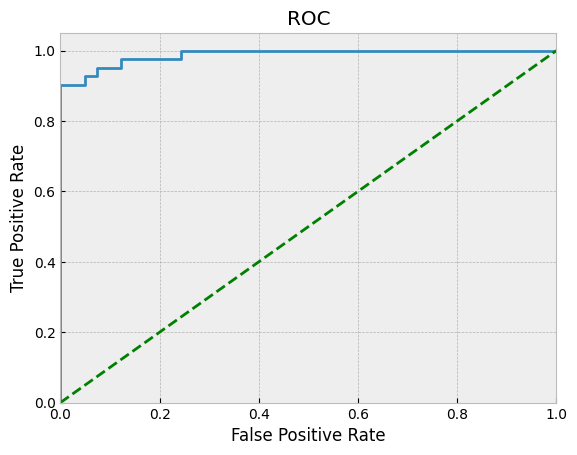

In [114]:
from sklearn.metrics import roc_auc_score,roc_curve
rf_roc_auc = roc_auc_score(y_test, rf_cv.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, rf_cv.predict_proba(X_test)[:,1])

plt.figure()
plt.plot(fpr, tpr, label = 'AUC (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'g--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.show()

[[134  28]
 [ 21 141]]


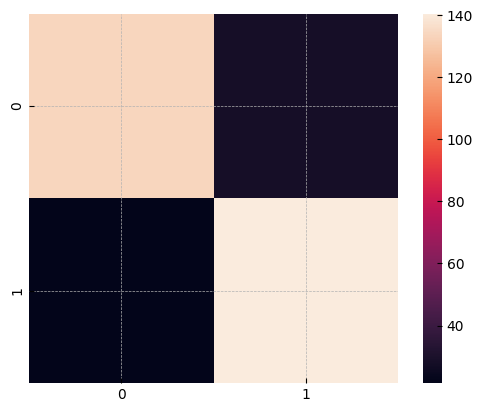

In [115]:
# Visualization Confusion Matrix
conf_mat = confusion_matrix(y_train, rf_train_pred)
print(conf_mat)

# Visualize it as a heatmap
import seaborn
seaborn.heatmap(conf_mat, square = True, robust = True)
plt.show()

The top-left cell (138) corresponds to instances that were truly "will not die," and the model correctly predicted them as "will not die" (true negatives).

The top-right cell (24) represents instances that were actually "will not die," but the model incorrectly predicted them as "will die" (false positives).

The bottom-left cell (22) signifies instances that were truly "will die," but the model incorrectly predicted them as "will not die" (false negatives).

The bottom-right cell (140) stands for instances that were actually "will die," and the model correctly predicted them as "will die" (true positives).

In total, there were 162 instances of each class in the test set. The model made correct class predictions for 278 instances (true positives + true negatives) and incorrect predictions for 46 instances (false positives + false negatives).

Precision for "will die" = true positives / (true positives + false positives) = 140 / (140 + 24) = 0.8537

Recall for "will die" = true positives / (true positives + false negatives) = 140 / (140 + 22) = 0.8642

Precision for "will not die" = true negatives / (true negatives + false negatives) = 138 / (138 + 22) = 0.8625

Recall for "will not die" = true negatives / (true negatives + false positives) = 138 / (138 + 24) = 0.8519

In [127]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
random_forest = RandomForestClassifier()


In [128]:
#parametres for search
random_forest_params = {"max_depth": [3, 5, 8],
             "max_features": [3, 5, 8],
             "n_estimators": [10, 50, 100],
             "min_samples_split": [2, 5, 10]}

# Search the best parametres with GridSearchCV() function
random_forest_cv_model = GridSearchCV(random_forest, random_forest_params, cv = 10, n_jobs = -1,)

In [131]:
random_forest_cv_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 8], 'max_features': [3, 5, 8],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [10, 50, 100]})

In [132]:
random_forest_cv_model.best_params_
random_forest_best = random_forest_cv_model.best_estimator_
random_forest_best

RandomForestClassifier(max_depth=3, max_features=3, min_samples_split=10,
                       n_estimators=10)

In [134]:
random_forest_model = RandomForestClassifier(n_estimators = random_forest_cv_model.best_params_["n_estimators"],
                                max_depth = random_forest_cv_model.best_params_["max_depth"],
                                max_features = random_forest_cv_model.best_params_["max_features"],
                                min_samples_split = random_forest_cv_model.best_params_["min_samples_split"])
my_model=random_forest_model.fit(X_train, y_train)
my_model

RandomForestClassifier(max_depth=3, max_features=3, min_samples_split=10,
                       n_estimators=10)

In [136]:
y_pred = random_forest_model.predict(X_test)
accuracy_score(y_test, y_pred)


0.8902439024390244

The model acheived overall effiency of about 89%

In [137]:
from sklearn.metrics import classification_report

# When calling classification_report
print(classification_report(y_test, y_pred, zero_division=1))


              precision    recall  f1-score   support

           0       0.86      0.93      0.89        41
           1       0.92      0.85      0.89        41

    accuracy                           0.89        82
   macro avg       0.89      0.89      0.89        82
weighted avg       0.89      0.89      0.89        82



In [139]:
!pip install shap
import shap


[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [140]:
shap.initjs()

In [141]:
explainer = shap.TreeExplainer(rf_cv)
shap_values = explainer.shap_values(model_data)

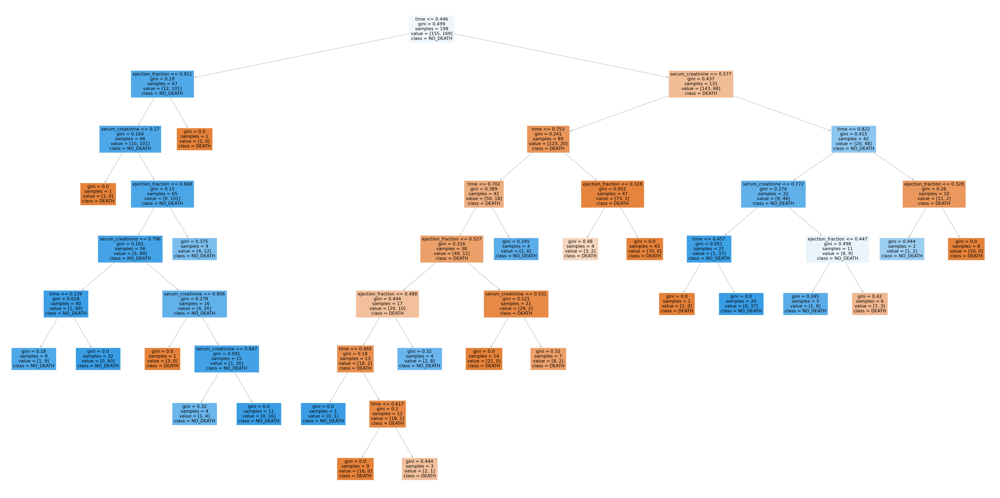

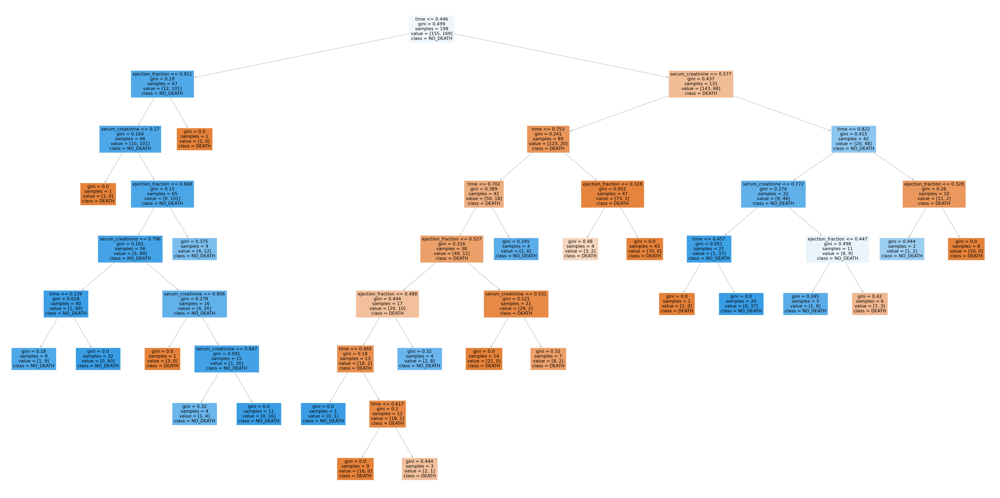

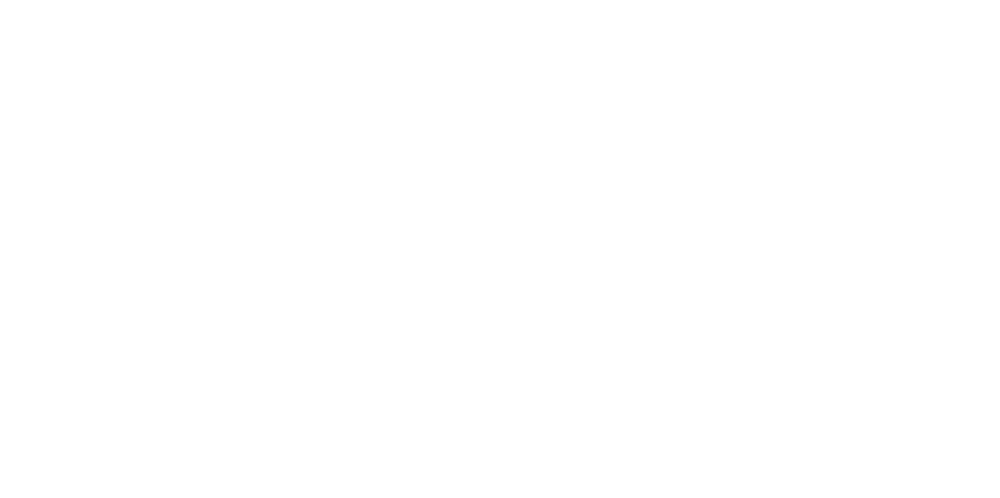

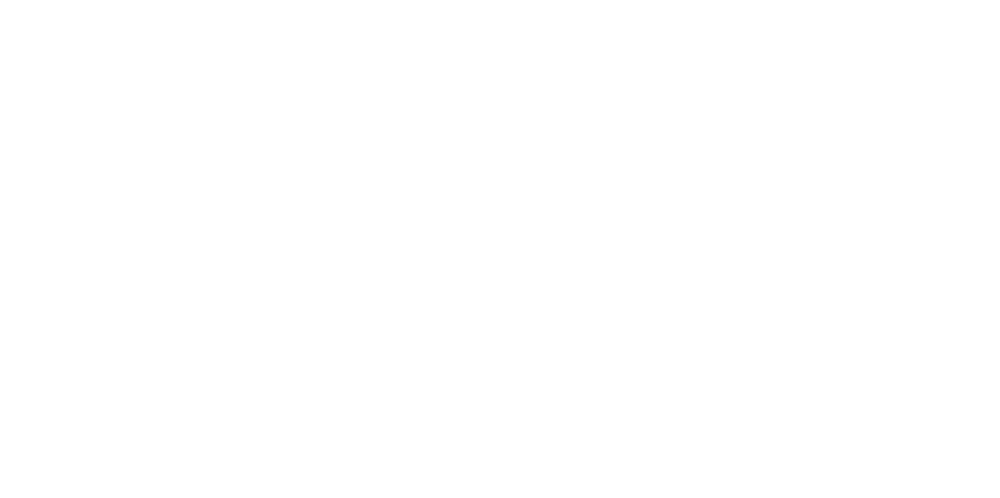

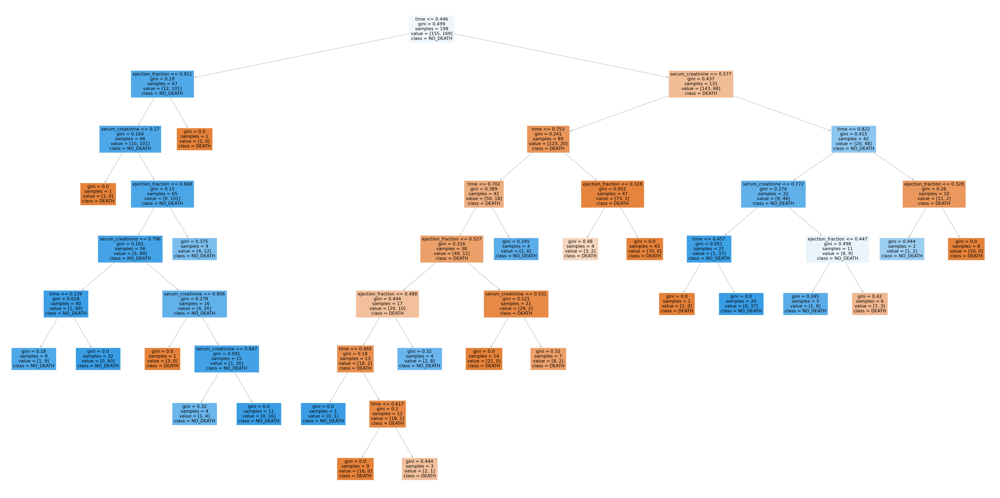

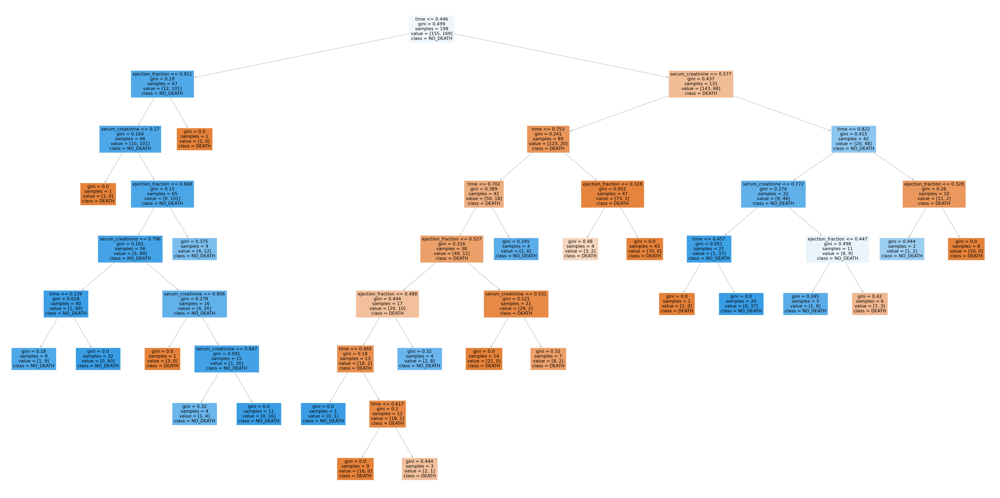

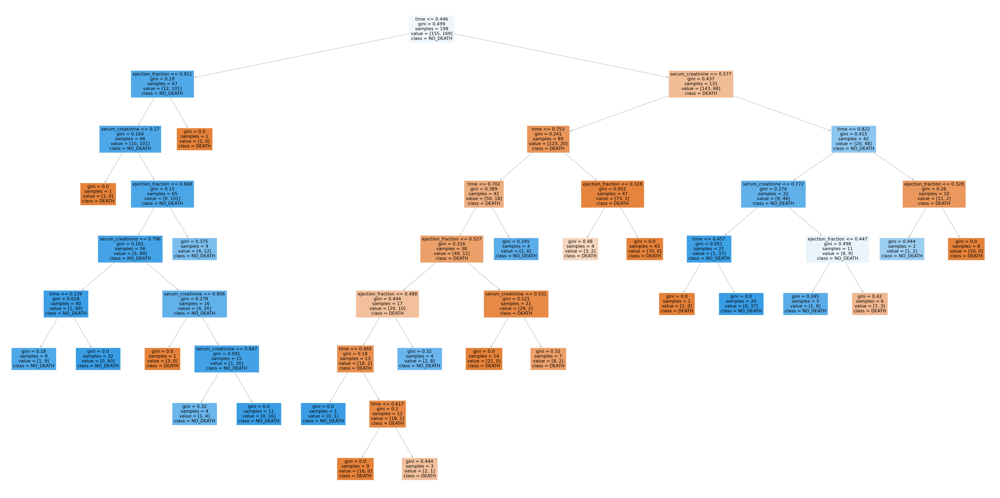

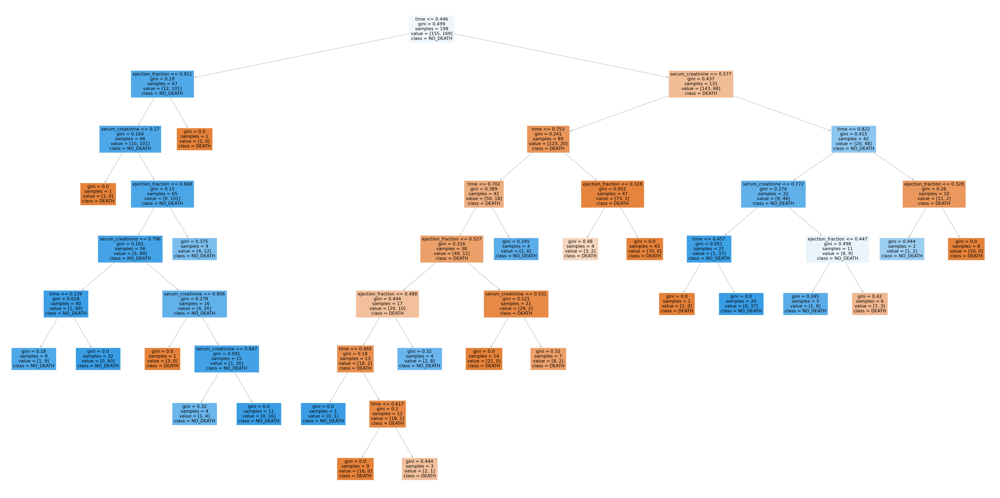

<Figure size 8000x4000 with 0 Axes>

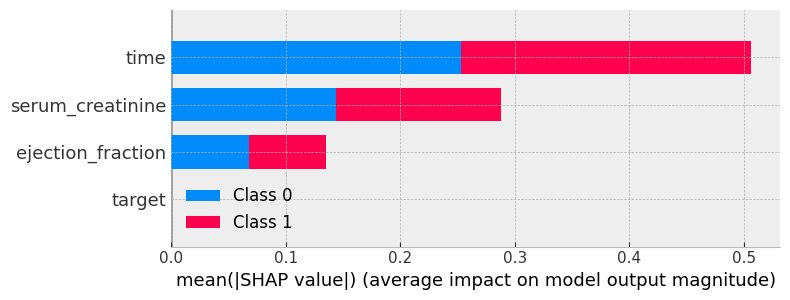

In [142]:
shap.summary_plot(shap_values, features=model_data, 
                        feature_names=model_data.columns, 
                        plot_type="bar")

The summary plot is a bar chart that showcases the most influential features in a descending order. Features at the top of the chart have the greatest influence on the model's predictions. Each bar in the chart corresponds to a specific feature, and the height of the bar represents the average absolute value of its SHAP (Shapley Additive Explanations) value across all instances.

## Model Evaluation

In [143]:
models = ['kNN', 'Logistic Regression', 'Non-Linear SVM','Random Forest']
model_colors = sns.color_palette("Dark2")
accuracy = []
recall = []
precision = []
f1 = []
auc = []
predictions = [knn_train_pred, lr_train_pred, 
               rbf_svm_train_pred, rf_train_pred]

for model_pred in predictions:
    accuracy.append(accuracy_score(y_train, model_pred))
    precision.append(precision_score(y_train, model_pred))
    recall.append(recall_score(y_train, model_pred))
    f1.append(f1_score(y_train, model_pred))
    auc.append(roc_auc_score(y_train, model_pred))

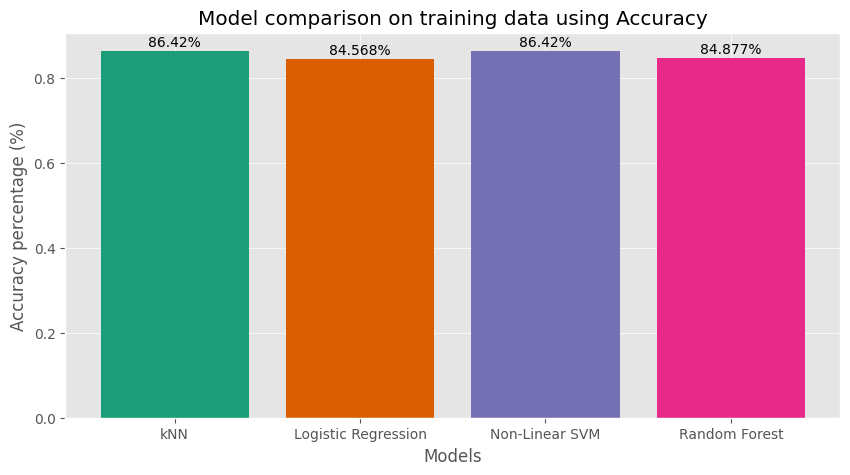

In [144]:
with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 5))
    plt.bar(models, accuracy, color=model_colors)
    for m, a in zip(models, accuracy):
        plt.text(m, a+0.01 , f'{round(a*100, 3)}%', ha='center')
    plt.xlabel('Models')
    plt.ylabel('Accuracy percentage (%)')
    plt.title('Model comparison on training data using Accuracy')
    plt.show()

Non linear SVM(RBF Kernel and Knn) seem to have outperformed the rest

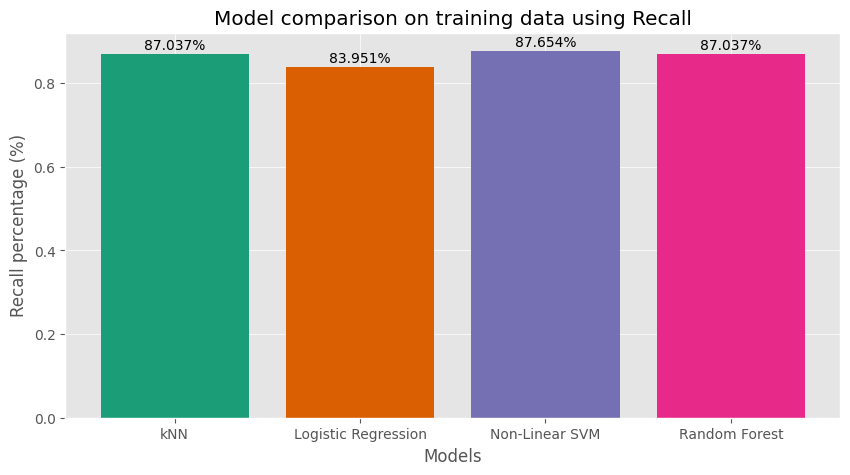

In [145]:
with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 5))
    plt.bar(models, recall, color=model_colors)
    for m, a in zip(models, recall):
        plt.text(m, a+0.01 , f'{round(a*100, 3)}%', ha='center')
    plt.xlabel('Models')
    plt.ylabel('Recall percentage (%)')
    plt.title('Model comparison on training data using Recall')
    plt.show()

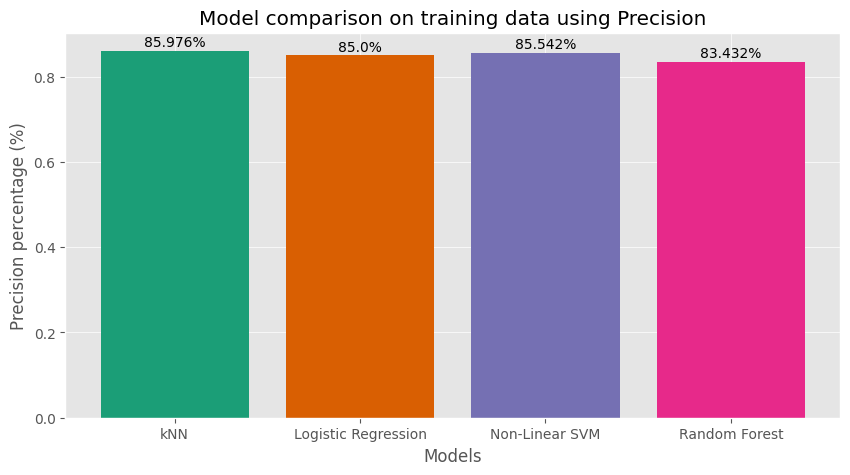

In [146]:
with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 5))
    plt.bar(models, precision, color=model_colors)
    for m, a in zip(models, precision):
        plt.text(m, a+0.01 , f'{round(a*100, 3)}%', ha='center')
    plt.xlabel('Models')
    plt.ylabel('Precision percentage (%)')
    plt.title('Model comparison on training data using Precision')
    plt.show()

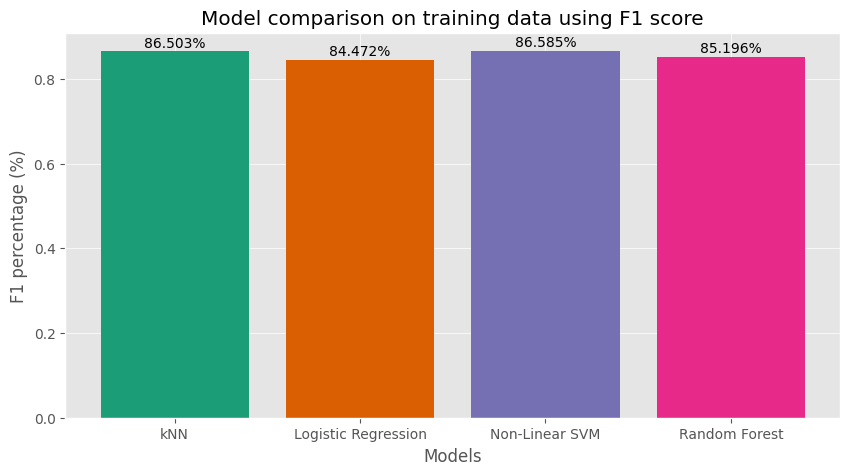

In [147]:
with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 5))
    plt.bar(models, f1, color=model_colors)
    for m, a in zip(models, f1):
        plt.text(m, a+0.01 , f'{round(a*100, 3)}%', ha='center')
    plt.xlabel('Models')
    plt.ylabel('F1 percentage (%)')
    plt.title('Model comparison on training data using F1 score')
    plt.show()

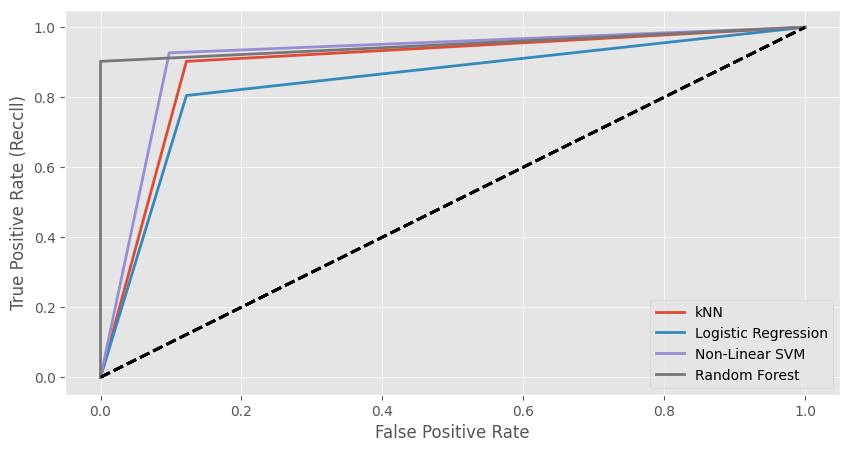

In [148]:
best_models = [knn_cv, lr_cv, rbf_svm_cv, rf_cv]
with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 5))
    for name, model in zip(models, best_models):
        best_predictions = model.predict(X_test)
        fpr, tpr, thresholds = roc_curve(y_test, best_predictions)
        plt.plot(fpr, tpr, linewidth=2, label=name)
        plt.plot([0, 1], [0, 1], 'k--') 
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate (Reccll)')
    plt.legend()
    plt.show()

When comparing models using the ROC Curve, we examine the trade-off between the true positive rate (recall) and the false positive rate (FPR). The ROC curve illustrates this trade-off, and a superior classifier strives to stay far from the dotted line, which represents the ROC curve of a purely random classifier.

To gauge and compare classifiers, one common metric is the area under the curve (AUC) of the ROC curve. An ideal classifier will have an ROC AUC of 1, while a completely random classifier will have an ROC AUC of 0.5.

Among the models, the non-linear SVM stands out with the highest AUC value.


## AUTO ML

AutoML, short for Automated Machine Learning, refers to the process of automating various tasks in the machine learning pipeline to simplify and expedite the development of machine learning models. AutoML systems aim to make machine learning accessible to individuals and organizations with limited expertise in data science by automating tasks such as:

1. **Data Preprocessing**: This includes tasks like data cleaning, feature engineering, and feature selection. AutoML tools can automatically handle missing data, encode categorical variables, and perform other data transformations.

2. **Model Selection**: AutoML can automatically choose the appropriate machine learning algorithm or model architecture for a given problem. It typically explores a range of algorithms and hyperparameters to find the best-performing model.

3. **Hyperparameter Tuning**: Tuning hyperparameters (e.g., learning rate, number of trees in a random forest) is a crucial step in improving model performance. AutoML tools can search the hyperparameter space efficiently to optimize model performance.

4. **Ensemble Methods**: AutoML often leverages ensemble methods like stacking and blending to combine predictions from multiple models, further improving predictive accuracy.

5. **Model Evaluation**: AutoML systems perform cross-validation and other evaluation techniques to assess model performance and provide metrics such as accuracy, precision, recall, F1-score, and ROC AUC.

6. **Deployment**: Some AutoML platforms also facilitate model deployment, making it easier to put models into production.

AutoML is particularly valuable in scenarios where there is limited time, expertise, or computational resources available for manually fine-tuning and experimenting with machine learning models. It democratizes machine learning by allowing users to leverage automation for building effective predictive models.

Various libraries, platforms, and tools offer AutoML capabilities, including popular options like Auto-sklearn, H2O.ai, Google AutoML, and Microsoft Azure AutoML, among others. These tools vary in terms of features, customization options, and scalability, allowing users to choose the one that best fits their specific needs and constraints.

In [149]:
!pip3 install h2o


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip3 install --upgrade pip


In [150]:
import h2o
from h2o.automl import H2OAutoML

In [151]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "17.0.8.1" 2023-08-22 LTS; OpenJDK Runtime Environment Corretto-17.0.8.8.1 (build 17.0.8.1+8-LTS); OpenJDK 64-Bit Server VM Corretto-17.0.8.8.1 (build 17.0.8.1+8-LTS, mixed mode, sharing)
  Starting server from /Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/m0/pfl8np4d20v7jpr2h5w0v5t80000gn/T/tmp1xjqawf6
  JVM stdout: /var/folders/m0/pfl8np4d20v7jpr2h5w0v5t80000gn/T/tmp1xjqawf6/h2o_manish_started_from_python.out
  JVM stderr: /var/folders/m0/pfl8np4d20v7jpr2h5w0v5t80000gn/T/tmp1xjqawf6/h2o_manish_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.1
H2O_cluster_version_age:,1 month and 25 days
H2O_cluster_name:,H2O_from_python_manish_42xwop
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,2 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [152]:
df = h2o.import_file('https://raw.githubusercontent.com/Manish-dkv/Data_science_manish/main/Heart_failure_clinical_records_dataset%202.csv')
df["DEATH_EVENT"]=df["DEATH_EVENT"].asfactor()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [153]:
df.describe(chunk_summary=True)

Rows:299
Cols:13

Chunk compression summary: 
chunk_type    chunk_name                 count    count_percentage    size    size_percentage
------------  -------------------------  -------  ------------------  ------  -----------------
CBS           Binary                     6        46.1538             648  B  12.0941
C1N           1-Byte Integers (w/o NAs)  2        15.3846             734  B  13.6991
C2            2-Byte Integers            2        15.3846             1.3 KB  24.86
C2S           2-Byte Fractions           2        15.3846             1.3 KB  25.4573
C4S           4-Byte Fractions           1        7.69231             1.3 KB  23.8895

Frame distribution summary: 
                 size    number_of_rows    number_of_chunks_per_column    number_of_chunks
---------------  ------  ----------------  -----------------------------  ------------------
127.0.0.1:54321  5.2 KB  299               1                              13
mean             5.2 KB  299               1                              13
min              5.2 KB  299               1                              13
max              5.2 KB  299               1                              13
stddev           0  B    0                 0                              0
total            5.2 KB  299               1                              13

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
type,real,int,int,int,int,int,real,real,int,int,int,int,enum
mins,40.0,0.0,23.0,0.0,14.0,0.0,25100.0,0.5,113.0,0.0,0.0,4.0,
mean,60.83723745819399,0.431438127090301,581.8394648829429,0.4180602006688963,38.08361204013379,0.3511705685618729,263358.029264214,1.3938795986622083,136.62541806020067,0.6488294314381271,0.3210702341137124,130.26086956521738,
maxs,95.0,1.0,7861.0,1.0,80.0,1.0,850000.0,9.4,148.0,1.0,1.0,285.0,
sigma,11.900919367810587,0.4961072681330793,970.2878807124358,0.49406706510360904,11.834840741039168,0.47813637906274475,97804.2368685983,1.0345100640898544,4.412477283909234,0.47813637906274475,0.46767042805677167,77.61420795029336,
zeros,0,170,0,174,0,194,0,0,0,105,203,0,
missing,0,0,0,0,0,0,0,0,0,0,0,0,0
0,75.0,0.0,582.0,0.0,20.0,1.0,265000.0,1.9,130.0,1.0,0.0,4.0,1
1,55.0,0.0,7861.0,0.0,38.0,0.0,263358.03,1.1,136.0,1.0,0.0,6.0,1
2,65.0,0.0,146.0,0.0,20.0,0.0,162000.0,1.3,129.0,1.0,1.0,7.0,1


In [154]:
train, test = df.split_frame(ratios=[0.8], seed = 1)

In [155]:
aml = H2OAutoML(max_models =15,balance_classes=True,seed =1)

In [156]:
aml.train(training_frame = train, y = "DEATH_EVENT")

AutoML progress: |█
20:51:31.703: GBM_1_AutoML_1_20231211_205127 [GBM def_5] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for GBM model: GBM_1_AutoML_1_20231211_205127.  Details: ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 195.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 195.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 195.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 195.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 196.0.


██████████████████████████████████████

Model Details
=============
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_grid_1_AutoML_1_20231211_205127_model_1


Model Summary: 
    number_of_trees
--  -----------------
    41

ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.07194386807543407
RMSE: 0.2682235412402015
LogLoss: 0.2494289380557165
Mean Per-Class Error: 0.0984624706506097
AUC: 0.9635688858592744
AUCPR: 0.929152262094473
Gini: 0.9271377717185487

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34005865454673767
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      147  16   0.0982   (16.0/163.0)
1      8    73   0.0988   (8.0/81.0)
Total  155  89   0.0984   (24.0/244.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.340059     0.858824  88
max f2                       0.202343     0.906977  105
max f0point5                 0.692258     0.894428  64
max accuracy                 0.678409     0.905738  67
max precision                0.963094     1         0
max recall                   0.0581694    1         163
max specificity              0.963094     1         0
max absolute_mcc             0.29025      0.786199  95
max min_per_class_accuracy   0.340059     0.901235  88
max mean_per_class_accuracy  0.29025      0.907786  95
max tns                      0.963094     163       0
max fns                      0.963094     80        0
max fps                      0.0155066    163       243
max tps                      0.0581694    81        163
max tnr                      0.963094     1         0
max fnr                      0.963094     0.987654  0
max fpr                      0.0155066    1         243
max tpr                      0.0581694    1         163

Gains/Lift Table: Avg response rate: 33.20 %, avg score: 33.02 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0122951                   0.957615           3.01235   3.01235            1                0.960549   1                           0.960549            0.037037        0.037037                   201.235   201.235            0.037037
2        0.0204918                   0.946394           3.01235   3.01235            1                0.952482   1                           0.957322            0.0246914       0.0617284                  201.235   201.235            0.0617284
3        0.0327869                   0.935488           3.01235   3.01235            1                0.942609   1                           0.951804            0.037037        0.0987654                  201.235   201.235            0.0987654
4        0.0409836                   0.921568           3.01235   3.01235            1                0.928132   1                           0.94707             0.0246914       0.123457                   201.235   201.235            0.123457
5        0.0532787                   0.915046           3.01235   3.01235            1                0.91725    1                           0.940188            0.037037        0.160494                   201.235   201.235            0.160494
6        0.102459                    0.889568           2.76132   2.89185            0.916667         0.906671   0.96                        0.9241              0.135802        0.296296                   176.132   189.185            0.290161
7        0.151639                    0.82861            3.01235   2.93093            1                0.865

In [157]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
XGBoost_grid_1_AutoML_1_20231211_205127_model_1,0.915701,0.341161,0.829936,0.138605,0.321621,0.10344
StackedEnsemble_AllModels_1_AutoML_1_20231211_205127,0.915019,0.347618,0.819881,0.154018,0.329283,0.108427
GBM_3_AutoML_1_20231211_205127,0.91358,0.354905,0.837617,0.144588,0.335149,0.112325
XGBoost_1_AutoML_1_20231211_205127,0.913429,0.377849,0.835059,0.157123,0.342267,0.117147
GBM_4_AutoML_1_20231211_205127,0.91252,0.357277,0.828183,0.147807,0.334846,0.112122
StackedEnsemble_BestOfFamily_1_AutoML_1_20231211_205127,0.912065,0.353431,0.816263,0.150913,0.332039,0.11025
XRT_1_AutoML_1_20231211_205127,0.908581,0.3796,0.813474,0.169318,0.351085,0.123261
XGBoost_2_AutoML_1_20231211_205127,0.907975,0.375669,0.812232,0.160115,0.341112,0.116357
GBM_2_AutoML_1_20231211_205127,0.905855,0.374125,0.820211,0.147618,0.344538,0.118706
DRF_1_AutoML_1_20231211_205127,0.905173,0.379091,0.802143,0.156783,0.350449,0.122814


In [158]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_grid_1_AutoML_1_20231211_205127_model_1


Model Summary: 
    number_of_trees
--  -----------------
    41

ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.07194386807543407
RMSE: 0.2682235412402015
LogLoss: 0.2494289380557165
Mean Per-Class Error: 0.0984624706506097
AUC: 0.9635688858592744
AUCPR: 0.929152262094473
Gini: 0.9271377717185487

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34005865454673767
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      147  16   0.0982   (16.0/163.0)
1      8    73   0.0988   (8.0/81.0)
Total  155  89   0.0984   (24.0/244.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.340059     0.858824  88
max f2                       0.202343     0.906977  105
max f0point5              

Variable Importances:

time : 0.5

serum_creatinine : 0.19

ejection_fraction : 0.12

In [159]:
best_model.model_performance(test)

ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.13453478442323413
RMSE: 0.3667898368592485
LogLoss: 0.4044816702709259
Mean Per-Class Error: 0.19583333333333333
AUC: 0.86
AUCPR: 0.7003874396642032
Gini: 0.72

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1769460290670395
       0    1    Error    Rate
-----  ---  ---  -------  -----------
0      27   13   0.325    (13.0/40.0)
1      1    14   0.0667   (1.0/15.0)
Total  28   27   0.2545   (14.0/55.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.176946     0.666667  26
max f2                       0.0777068    0.806452  32
max f0point5                 0.812037     0.697674  6
max accuracy                 0.812037     0.818182  6
max precision                0.953248     1         0
max recall                   0.0777068    1         32
max specificity              0.953248     1         0
max absolute_mcc             0.176946     0.541946  26
max min_per_class_accuracy   0.244793     0.75      21
max mean_per_class_accuracy  0.176946     0.804167  26
max tns                      0.953248     40        0
max fns                      0.953248     14        0
max fps                      0.0145271    40        54
max tps                      0.0777068    15        32
max tnr                      0.953248     1         0
max fnr                      0.953248     0.933333  0
max fpr                      0.0145271    1         54
max tpr                      0.0777068    1         32

Gains/Lift Table: Avg response rate: 27.27 %, avg score: 28.08 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0181818                   0.95266            3.66667   3.66667            1                0.953248   1                           0.953248            0.0666667       0.0666667                  266.667   266.667            0.0666667
2        0.0363636                   0.949632           3.66667   3.66667            1                0.952159   1                           0.952704            0.0666667       0.133333                   266.667   266.667            0.133333
3        0.0363636                   0.932575           0         3.66667            0                0          1                           0.952704            0               0.133333                   -100      266.667            0.133333
4        0.0545455                   0.916389           3.66667   3.66667            1                0.920571   1                           0.941993            0.0666667       0.2                        266.667   266.667            0.2
5        0.0545455                   0.902274           0         3.66667            0                0          1                           0.941993            0               0.2                        -100      266.667            0.2
6        0.109091                    0.832908           2.44444   3.05556            0.666667         0.86635    0.833333                    0.904172            0.133333        0.333333                   144.444   205.556            0.308333
7        0.163636                    0.582441           1.22222   2.44444            0.333333         0.682482   0.666667                    0.830275            0.0666667       0.4                        22.2222   144.444            0.325
8        0.2                         0.470127           1.83333   2.33333            0.5              0

LogLoss, also known as logarithmic loss, quantifies how well a model's predicted probabilities align with the actual labels. Smaller LogLoss values indicate better model performance.

Mean Per-Class Error computes the average error rate for individual classes, measuring how often the model misclassifies instances in each class. Lower Mean Per-Class Error values signify better model performance.

AUC (Area Under the Receiver Operating Characteristic Curve) assesses the model's performance across various classification thresholds. Higher AUC values indicate superior model performance.

AUCPR (Area Under the Precision-Recall Curve) evaluates the model's performance across different precision-recall thresholds. Greater AUCPR values reflect better model performance, particularly in scenarios with imbalanced datasets.

Gini is a measure of inequality in a distribution. In the context of classification models, Gini is calculated as 2 times the AUC minus 1. Higher Gini values signify better model performance, with less inequality in predictions.

These metrics provide insights into different aspects of model performance and help assess the quality of classification models.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

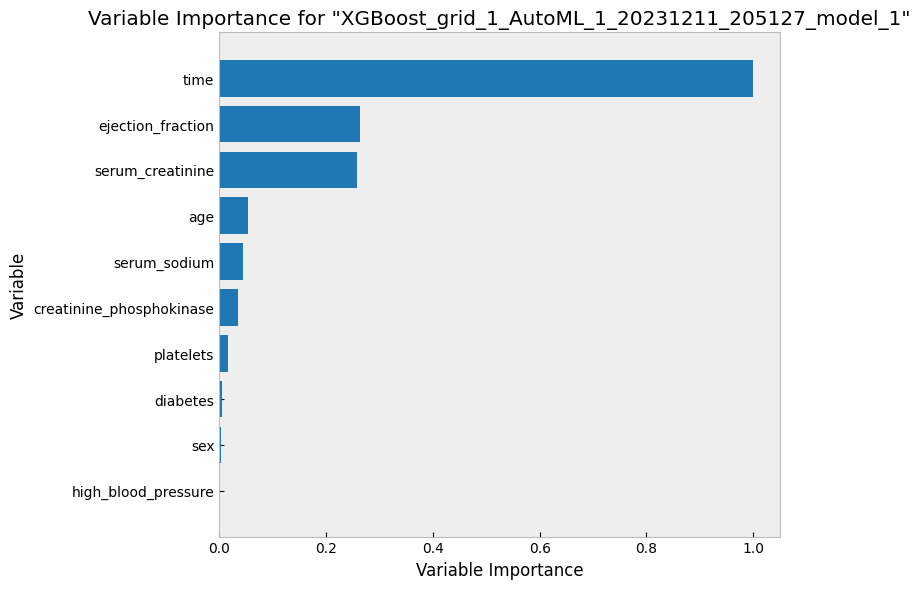

In [160]:
explain_model = aml.explain(frame = test, figsize = (8,6),include_explanations=['varimp'])

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

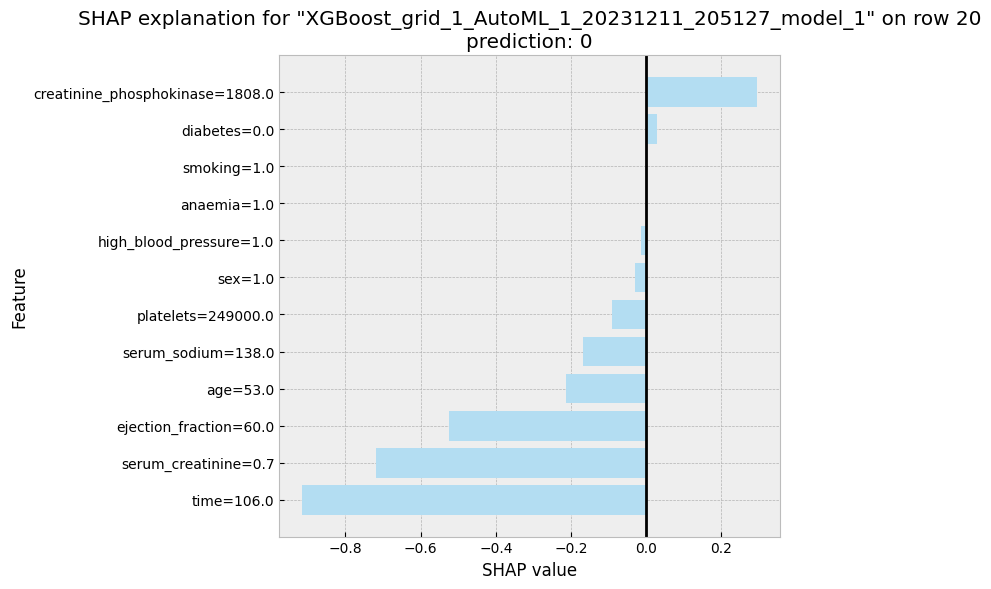

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

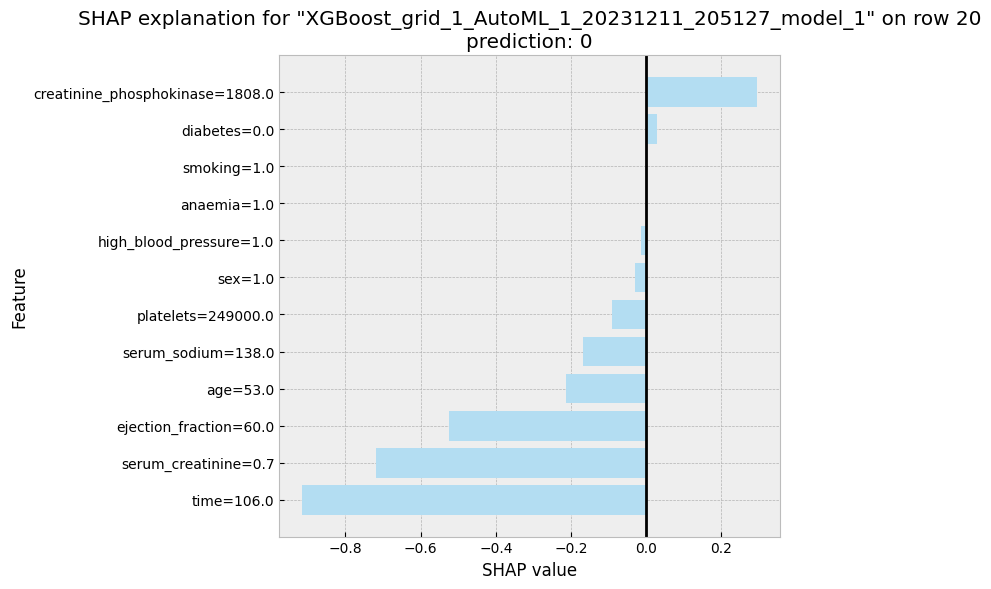

In [161]:
aml.explain_row(frame = test, row_index = 20, figsize = (8,6), exclude_explanations = "leaderboard")

## SHAP EXPLANATION

    SHAP explanations reveal how individual features contribute to the prediction of a specific instance. The combined contributions of features, along with a bias term, equal the model's raw prediction before any transformations are applied. In cases where features are correlated, H2O's implementation of TreeSHAP may assign more importance to a feature that originally had little influence on the prediction. This highlights how feature interactions can impact their contributions to the model's output.

## QUESTIONS

The following must be answered:

**1. What is the question?**

   ANSWER: This dataset encompasses a comprehensive array of factors that can significantly influence the occurrence of a Death Event. It comprises a wide spectrum of individual-specific information, including essential attributes such as age, gender, blood pressure, smoking status, diabetes status, ejection fraction (a measure of heart performance), creatinine phosphokinase levels, serum creatinine levels, serum sodium levels, and time. The overarching objective of this dataset is to leverage these diverse features to predict the likelihood of a Death Event, which is a critical and life-altering outcome. By analyzing and modeling these multifaceted variables, it becomes possible to gain valuable insights into the complex interplay of factors that contribute to the occurrence of such events, ultimately facilitating early detection, intervention, and personalized healthcare strategies.
    
    
    
**2. What did you do?**
    Answer: The comprehensive analysis of the dataset involved an intricate process of data understanding, exploration, and preprocessing. This meticulous examination aimed to discern the nature of the data, shedding light on its characteristics and intricacies. Through rigorous data preprocessing, a refined set of features emerged, carefully curated to be instrumental in predicting the target variable. These selected features were the culmination of thoughtful consideration, taking into account their relevance, significance, and potential impact on the predictive task at hand.

Following the meticulous feature selection process, the analytical journey advanced to model development and evaluation. Three distinct models were meticulously crafted and rigorously executed, each representing a unique approach to solving the predictive challenge. These models were thoughtfully chosen to encompass a diverse range of machine learning algorithms, harnessing their respective strengths and capabilities.

The interpretation of these models was a pivotal phase in the analytical journey, as it involved delving deep into the intricate web of model outputs, coefficients, and predictions. The primary objective was to discern patterns, uncover insights, and evaluate the performance of each model rigorously. This interpretative process yielded a profound understanding of the predictive power of each model, shedding light on their strengths, weaknesses, and nuances.

Ultimately, this exhaustive analytical endeavor culminated in the identification of the best-performing model among the three contenders. This model, meticulously selected based on rigorous evaluation criteria, emerged as the champion in the realm of predictive analytics, showcasing its prowess in accurately forecasting the target variable. This culmination marked a significant milestone in the data analysis journey, highlighting the power of data-driven insights and modeling techniques in solving complex real-world challenges.



**3. How well did it work?**
    Answer: The successful execution of the analysis revealed a remarkable synergy between automated machine learning (AutoML) and the formidable Random Forest algorithm. Both approaches converged on a common set of pivotal features, underscoring their significance in the predictive task at hand. To ensure the integrity of the analysis, the dataset underwent a meticulous balancing process through the application of the Synthetic Minority Over-sampling Technique (SMOTE). This strategic step rectified any class imbalance issues, ensuring that the models could effectively learn from the data.

Further scrutiny of the dataset unveiled features that deviated from the normal distribution, a critical observation that demanded attention. To address this, a multi-faceted approach was employed, involving the meticulous application of techniques such as Min-Max scaling and logarithmic transformations. These methods effectively rectified the distribution irregularities, enhancing the suitability of the data for modeling.

With the dataset meticulously preprocessed and primed for modeling, a battery of machine learning models was meticulously crafted and executed. These models embarked on the formidable task of translating data into predictions, leveraging the wealth of insights extracted during the preceding stages of analysis. Amidst this rigorous competition of algorithms, two models emerged as the frontrunners: the formidable Support Vector Machine (SVM) and the powerful XGBoost.

These models, carefully selected based on their outstanding performance and predictive prowess, marked a pivotal moment in the analysis. Their ability to effectively harness the preprocessed data and generate accurate predictions underscored their superiority in tackling the complex challenge of forecasting the target variable. This harmonious combination of data preprocessing, feature selection, and model evaluation culminated in a triumph of data-driven decision-making, highlighting the transformative potential of advanced analytics in extracting valuable insights from data.



**4. What did you learn?**
    Answer:The journey of this data analysis venture has been an enlightening odyssey through the intricate landscape of data science. It was here that I acquired a profound understanding of the myriad techniques available to preprocess and refine raw data into a form suitable for machine learning models. The knowledge gained encompassed a diverse range of methods, from handling data imbalances using techniques like SMOTE to identifying and rectifying non-normal data distributions through strategic scaling and transformation.

But the learning didn't stop at data preprocessing; it extended into the realm of model interpretation and fine-tuning. The ability to decipher the nuances of model outputs, understand feature importance, and optimize hyperparameters to align models with specific requirements became valuable skills in this analytical journey.

In essence, this journey has been a comprehensive education in the art and science of data analysis. It equipped me not only with the technical skills to handle data effectively but also with the wisdom to extract meaningful insights and make data-driven decisions. It underscored the profound impact of data science in uncovering hidden patterns, predicting outcomes, and ultimately, empowering informed choices.


 ## Reference
 https://en.wikipedia.org/wiki/Kernel_density_estimation#:~:text=In%20statistics%2C%20kernel%20density%20estimation,based%20on%20kernels%20as%20weights

https://blogs.sas.com/content/iml/2014/09/02/hexagonal-bin-plot.html#:~:text=A%20hexagonal%20bin%20plot%20is,plot%20would%20suffer%20from%20overplotting

https://en.wikipedia.org/wiki/Random_forest

https://www.ibm.com/topics/logistic-regression#:~:text=Logistic%20regression%20estimates%20the%20probability,bounded%20between%200%20and%201

https://www.analyticsvidhya.com/blog/2020/10/overcoming-class-imbalance-using-smote-techniques/

Scikit-Learn Implementation of SVM: https://scikit-learn.org/stable/auto_examples/svm/plot_rbf_parameters.html

Radial Basis Function Kernel: https://en.wikipedia.org/wiki/Radial_basis_function_kernel

## Licensing:
MIT License Copyright (c) 2023 Manish Dinesh Kumar Vanitha Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions: The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software. THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.